# 🔍 Faster R-CNN Object Detection — From Scratch Understanding
## Lab 3 · Task 2 | Penn-Fudan Pedestrian Dataset

---

### What is this lab about?

We are building and training a **Faster R-CNN** (Region-based Convolutional Neural Network) — one of the most important object detection models ever published.

By the end of this notebook you will:
- Understand **what Faster R-CNN does** and how its 3 parts work together
- Train the model on real images with real bounding box labels
- **Visualize the Region Proposal Network (RPN)** — the "brain" that finds candidate objects
- Evaluate performance using **mAP** (mean Average Precision) — the standard metric
- Draw predicted boxes on test images and compare with ground truth

---

### The Dataset: Penn-Fudan Pedestrian

A small, clean dataset of ~170 images of pedestrians on university campuses.
Each image has pixel-precise masks and bounding boxes for every person.

**Why this dataset?**
- Lightweight (~50MB) — trains in minutes on Colab GPU
- Clean annotations — great for learning
- Only 1 object class (person) — easy to understand what the model is doing

---

### Faster R-CNN in Plain English

Imagine you're looking for people in a photo. You'd first **scan the image** for any region that *might* contain a person, then **zoom in on each region** and decide "yes, that's a person" or "no, that's just a pole."

That's exactly what Faster R-CNN does:

```
Image → [Backbone CNN] → Feature Map
                              ↓
                    [RPN] → Region Proposals  (Step 1: "where might objects be?")
                              ↓
                    [RoI Head] → Final Detections  (Step 2: "what exactly is it?")
```

The key innovation: the RPN and the detector **share the backbone** — so the heavy feature extraction only happens once, making it fast.


## Step 1 — Install & Import Everything

In [1]:
# torchmetrics gives us proper mAP calculation
# pycocotools is needed by torchmetrics for COCO-style mAP
!pip install torchmetrics pycocotools --quiet

import os, time, copy, json, zipfile, urllib.request
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import to_rgba

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as T
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator

from torchmetrics.detection.mean_ap import MeanAveragePrecision

print("PyTorch version :", torch.__version__)
print("Torchvision     :", torchvision.__version__)
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("Using device    :", DEVICE)
if DEVICE.type == 'cuda':
    print("GPU             :", torch.cuda.get_device_name(0))


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 32.9 MB/s eta 0:00:00
PyTorch version : 2.10.0+cu128
Torchvision     : 0.25.0+cu128
Using device    : cuda
GPU             : Tesla T4


## Step 2 — Download Penn-Fudan Dataset

Penn-Fudan contains 170 images of pedestrians photographed at the University of Pennsylvania
and Fudan University. Every person in every image has a **bounding box** and a **segmentation mask**.

We only use the bounding boxes for Faster R-CNN.


In [2]:
DATA_ROOT = Path("PennFudanPed")

if not DATA_ROOT.exists():
    url = "https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip"
    print("Downloading Penn-Fudan dataset (~50MB)...")
    urllib.request.urlretrieve(url, "PennFudanPed.zip")
    with zipfile.ZipFile("PennFudanPed.zip", 'r') as z:
        z.extractall(".")
    print("Extracted!")
else:
    print("Dataset already present.")

# Count images and masks
imgs  = sorted((DATA_ROOT / "PNGImages").glob("*.png"))
masks = sorted((DATA_ROOT / "PedMasks").glob("*.png"))
print(f"Images : {len(imgs)}")
print(f"Masks  : {len(masks)}")

# Quick look at one image
sample_img  = Image.open(imgs[0]).convert("RGB")
sample_mask = Image.open(masks[0])
print(f"Sample image size: {sample_img.size}")
print(f"Unique mask values (each value = one person): {np.unique(np.array(sample_mask))}")


Extracted!
Images : 170
Masks  : 170
Sample image size: (559, 536)
Unique mask values (each value = one person): [0 1 2]


### Visualise a Few Raw Samples

Let's look at what the raw images and their masks look like before training.
Each coloured region in the mask = one labelled person.


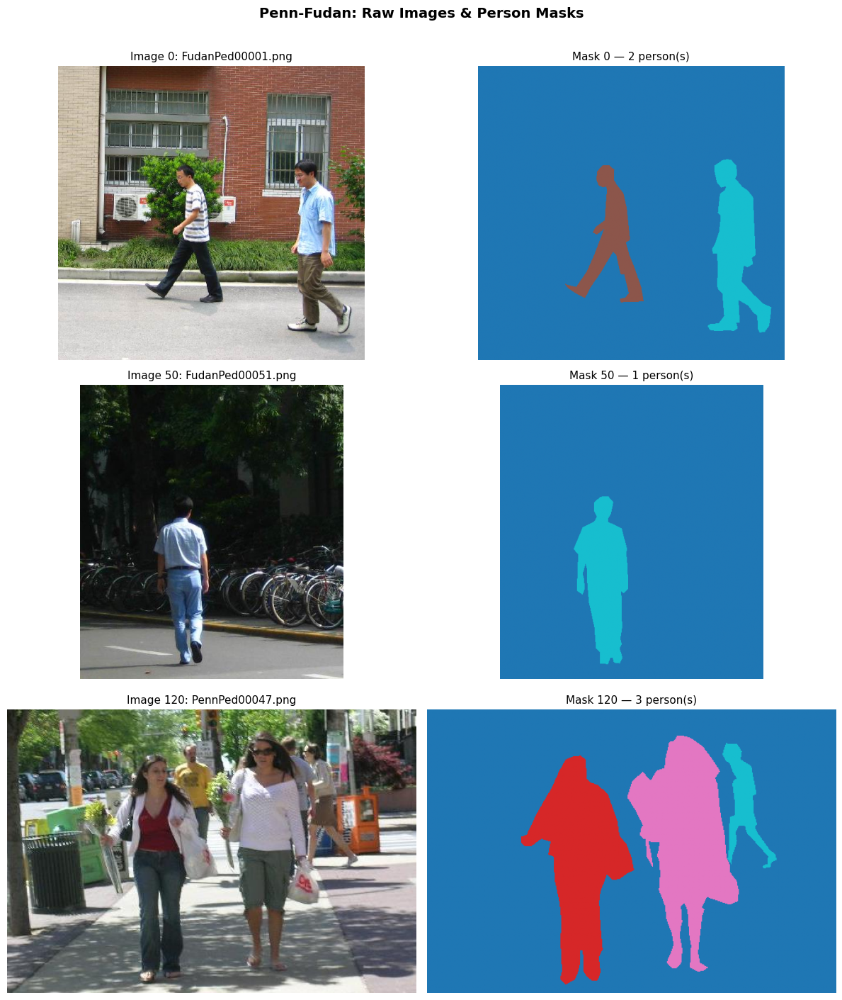

Each colour in the mask = one unique person.


In [3]:
fig, axes = plt.subplots(3, 2, figsize=(12, 14))
for row, idx in enumerate([0, 50, 120]):
    img  = Image.open(imgs[idx]).convert("RGB")
    mask = Image.open(masks[idx])
    mask_arr = np.array(mask)

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(f"Image {idx}: {imgs[idx].name}", fontsize=11)
    axes[row, 0].axis("off")

    axes[row, 1].imshow(mask_arr, cmap="tab10")
    axes[row, 1].set_title(f"Mask {idx} — {len(np.unique(mask_arr))-1} person(s)", fontsize=11)
    axes[row, 1].axis("off")

plt.suptitle("Penn-Fudan: Raw Images & Person Masks", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("sample_images.png", dpi=120, bbox_inches="tight")
plt.show()
print("Each colour in the mask = one unique person.")


## Step 3 — Build a Custom PyTorch Dataset

PyTorch needs a **Dataset** class that tells it:
1. How many images are there? (`__len__`)
2. Given an index, return that image + all its bounding boxes + labels (`__getitem__`)

We extract bounding boxes from the masks: every distinct coloured region gives us one box.


In [4]:
class PennFudanDataset(torch.utils.data.Dataset):
    """
    Wraps the Penn-Fudan images so PyTorch can load them one by one.

    For each image we:
      1. Load the PNG photo
      2. Load the corresponding mask (each person = unique pixel value)
      3. Extract bounding boxes from those mask regions
      4. Return image + annotation dict that Faster R-CNN expects
    """

    def __init__(self, root, transforms=None):
        self.root = Path(root)
        self.transforms = transforms
        # Sort so images[i] always matches masks[i]
        self.imgs  = sorted((self.root / "PNGImages").glob("*.png"))
        self.masks = sorted((self.root / "PedMasks").glob("*.png"))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img  = Image.open(self.imgs[idx]).convert("RGB")
        mask = Image.open(self.masks[idx])
        mask_arr = np.array(mask)  # shape: (H, W), values 0 = background, 1..N = persons

        # Each unique non-zero value represents one person
        obj_ids = np.unique(mask_arr)[1:]   # drop 0 (background)
        num_objs = len(obj_ids)

        # Create a binary mask for each person, then get their bounding box
        boxes = []
        for obj_id in obj_ids:
            pos = np.where(mask_arr == obj_id)   # pixel positions of this person
            xmin, xmax = float(pos[1].min()), float(pos[1].max())
            ymin, ymax = float(pos[0].min()), float(pos[0].max())
            # Skip degenerate boxes (width or height = 0)
            if xmax > xmin and ymax > ymin:
                boxes.append([xmin, ymin, xmax, ymax])

        num_objs = len(boxes)  # update in case we dropped any

        # Faster R-CNN expects tensors in a specific format
        boxes  = torch.as_tensor(boxes, dtype=torch.float32) if boxes else torch.zeros((0, 4))
        labels = torch.ones((num_objs,), dtype=torch.int64)   # class 1 = person (0 = background)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if num_objs > 0 else torch.zeros(0)
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {
            "boxes":    boxes,
            "labels":   labels,
            "image_id": image_id,
            "area":     area,
            "iscrowd":  iscrowd,
        }

        # Convert PIL image to tensor (values 0–1)
        img_tensor = T.ToTensor()(img)

        if self.transforms:
            img_tensor, target = self.transforms(img_tensor, target)

        return img_tensor, target


# Quick sanity check
ds = PennFudanDataset("PennFudanPed")
img_t, tgt = ds[0]
print("Image tensor shape:", img_t.shape)         # (3, H, W)
print("Bounding boxes:\n", tgt["boxes"])
print("Labels:", tgt["labels"])                   # all 1s (person)
print("Number of persons in this image:", len(tgt["boxes"]))


Image tensor shape: torch.Size([3, 536, 559])
Bounding boxes:
 tensor([[159., 181., 301., 430.],
        [419., 170., 534., 485.]])
Labels: tensor([1, 1])
Number of persons in this image: 2


## Step 4 — Train / Validation Split

We split the 170 images into:
- **Training set**: 137 images (80%) — the model learns from these
- **Validation set**: 33 images (20%) — we test on these to see how well it generalises

We never train on the validation images, so the mAP score is honest.


In [5]:
import random

# Fix random seed so the split is reproducible
random.seed(42)
torch.manual_seed(42)

dataset = PennFudanDataset("PennFudanPed")
n_total = len(dataset)

indices = list(range(n_total))
random.shuffle(indices)

split = int(n_total * 0.8)
train_idx = indices[:split]
val_idx   = indices[split:]

train_dataset = torch.utils.data.Subset(dataset, train_idx)
val_dataset   = torch.utils.data.Subset(dataset, val_idx)

print(f"Total images : {n_total}")
print(f"Training set : {len(train_dataset)} images")
print(f"Validation   : {len(val_dataset)} images")

def collate_fn(batch):
    """
    Default PyTorch collation stacks tensors into a single big batch tensor.
    For detection we can't do that because each image may have different numbers of boxes.
    This function keeps them as a plain Python list instead.
    """
    return tuple(zip(*batch))

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=2,          # 2 images per step — safe for Colab T4 (15GB VRAM)
    shuffle=True,          # shuffle every epoch so model doesn't memorise order
    collate_fn=collate_fn,
    num_workers=2,
)

val_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=1,          # 1 image at a time for evaluation
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=2,
)

print(f"Train batches : {len(train_loader)}")
print(f"Val batches   : {len(val_loader)}")


Total images : 170
Training set : 136 images
Validation   : 34 images
Train batches : 68
Val batches   : 34


## Step 5 — Build the Faster R-CNN Model

We use **torchvision's pre-built Faster R-CNN** with:
- **ResNet50-FPN backbone** (pre-trained on ImageNet) — extracts features from images
- **Custom head** — we replace the original 91-class COCO head with a 2-class head (background + person)

This is called **transfer learning**: the backbone already knows how to recognise edges,
textures, and shapes from ImageNet training. We only need to teach it to detect *people*.

### Architecture Overview

```
Input Image (3×H×W)
      ↓
ResNet50 Backbone   →  extracts features at multiple scales (FPN = Feature Pyramid Network)
      ↓
RPN (Region Proposal Network)
  - Slides a small 3×3 window over the feature map
  - At each position, scores 9 anchor boxes (3 sizes × 3 aspect ratios)
  - Outputs ~2000 candidate "regions of interest" (RoIs) where objects might be
      ↓
RoI Align  →  crops and resizes each proposal to a fixed size (7×7)
      ↓
Detection Head (2 FC layers)
  - Classification: is this region background or person?
  - Box Regression: what are the precise box coordinates?
      ↓
Output: (boxes, labels, scores) for each detected person
```


In [6]:
def build_faster_rcnn(num_classes=2):
    """
    Build Faster R-CNN with ResNet50-FPN backbone.

    num_classes = 2:  class 0 = background (no object)
                      class 1 = person
    """
    # Load the model with COCO pre-trained weights
    # The backbone (ResNet50-FPN) is frozen in its initial state;
    # only the detection head will be replaced.
    model = fasterrcnn_resnet50_fpn(
        weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT
    )

    # The pre-trained head expects 91 COCO classes.
    # We replace it with a fresh head for 2 classes.
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model


model = build_faster_rcnn(num_classes=2)
model.to(DEVICE)

# Count trainable parameters
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters    : {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Model on device     : {DEVICE}")

# Show the main sub-modules so you can see how the model is structured
print("\nMain modules:")
for name, module in model.named_children():
    print(f"  {name:20s} → {type(module).__name__}")


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:02<00:00, 82.7MB/s]


Total parameters    : 41,299,161
Trainable parameters: 41,076,761
Model on device     : cuda

Main modules:
  transform            → GeneralizedRCNNTransform
  backbone             → BackboneWithFPN
  rpn                  → RegionProposalNetwork
  roi_heads            → RoIHeads


## Step 6 — Visualise RPN Anchors (Before Training)

The **RPN (Region Proposal Network)** uses pre-defined "anchor boxes" as starting points.
It then predicts how much to shift/resize each anchor to fit real objects.

Let's visualise what the anchors look like on a sample image.
This helps build intuition before we start training.


Total anchors on this image: 236,616


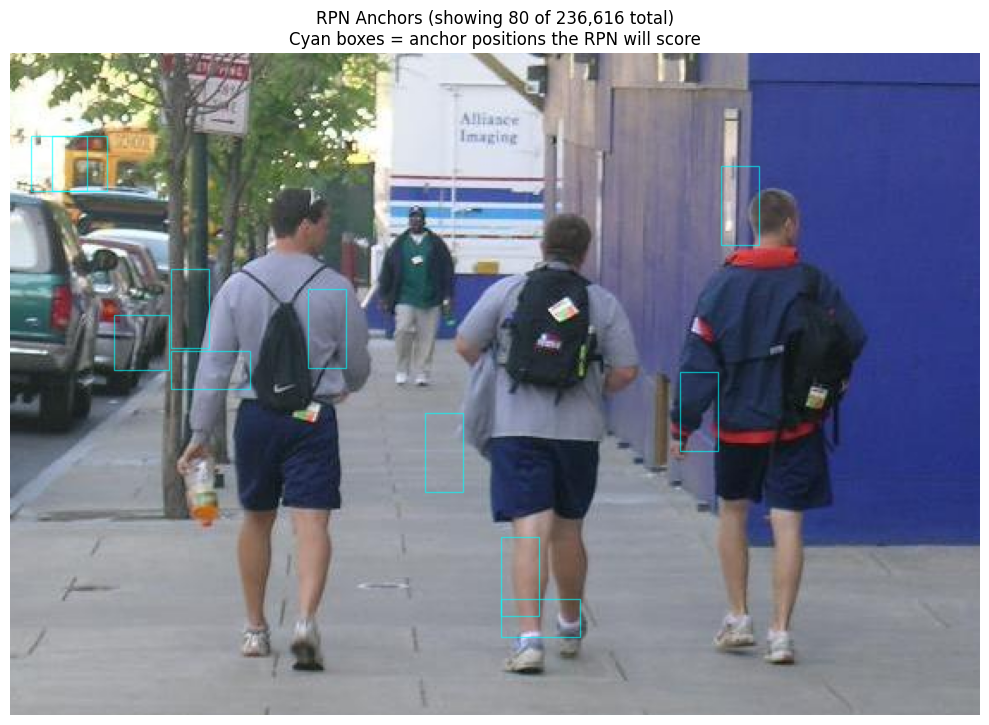

In [7]:
def draw_anchors_on_image(img_tensor, model, max_anchors=80, device=DEVICE):
    """
    Visualise a random sample of RPN anchor boxes on one image.

    Anchor boxes come in 3 sizes × 3 aspect ratios = 9 types per feature-map location.
    There are thousands of them — we show a random 80 for clarity.
    """
    model.eval()

    # Use model.transform to prepare the image as an ImageList object
    # model.transform expects a list of original images and an optional list of targets.
    # Since we only need the image for anchor generation, targets can be None.
    images, _ = model.transform([img_tensor.to(device)], None)

    with torch.no_grad():
        # Run backbone + FPN to get feature maps
        # features expects the tensor part of ImageList
        features = model.backbone(images.tensors)
        # Generate anchors for this image, passing the ImageList object
        anchors  = model.rpn.anchor_generator(images, list(features.values()))

    anchors_np = anchors[0].cpu().numpy()   # shape: (N_anchors, 4)
    print(f"Total anchors on this image: {len(anchors_np):,}")

    # Draw a random subset so the image is readable
    sample_idx = np.random.choice(len(anchors_np), size=min(max_anchors, len(anchors_np)), replace=False)

    h, w = img_tensor.shape[1:]
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    ax.imshow(img_tensor.permute(1, 2, 0).numpy())

    for i in sample_idx:
        x1, y1, x2, y2 = anchors_np[i]
        # Only draw anchors that fall (mostly) within the image
        if x1 >= 0 and y1 >= 0 and x2 <= w and y2 <= h:
            rect = plt.Rectangle(
                (x1, y1), x2-x1, y2-y1,
                linewidth=1, edgecolor='cyan', facecolor='none', alpha=0.6
            )
            ax.add_patch(rect)

    ax.set_title(
        f"RPN Anchors (showing {max_anchors} of {len(anchors_np):,} total)\n"
        "Cyan boxes = anchor positions the RPN will score",
        fontsize=12
    )
    ax.axis("off")
    plt.tight_layout()
    plt.savefig("rpn_anchors.png", dpi=120, bbox_inches="tight")
    plt.show()

# Use the first validation image
sample_img_t, _ = val_dataset[0]
draw_anchors_on_image(sample_img_t, model)


## Step 7 — Train the Model

We train for **7 epochs**.  One epoch = the model sees all 137 training images once.

### What happens during training?

For each batch of 2 images:
1. Forward pass: the model makes predictions on the images
2. **Loss calculation**: Faster R-CNN internally computes 4 loss values:
   - `loss_objectness`: did the RPN correctly find where objects are?
   - `loss_rpn_box_reg`: did the RPN correctly predict box positions?
   - `loss_classifier`: did the final head correctly classify each region?
   - `loss_box_reg`: did the final head correctly refine the boxes?
3. **Backpropagation**: compute gradients and update weights

We use **SGD with momentum** (a standard choice for detection) and a **learning rate scheduler**
that warms up for the first epoch then decays gradually.


In [8]:
# ── Optimiser ──────────────────────────────────────────────────────────────────
# SGD with momentum is the standard for Faster R-CNN
# Weight decay = L2 regularisation to prevent overfitting
optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

# Reduce learning rate by 0.1× every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# ── Training loop ──────────────────────────────────────────────────────────────
NUM_EPOCHS = 7
train_loss_history = []

print(f"Training Faster R-CNN for {NUM_EPOCHS} epochs on {DEVICE}\n")
print(f"{'Epoch':>5} | {'Loss':>10} | {'LR':>10} | {'Time':>8}")
print("-" * 45)

for epoch in range(1, NUM_EPOCHS + 1):
    model.train()
    epoch_losses = []
    t0 = time.time()

    for images, targets in train_loader:
        # Move data to GPU
        images  = [img.to(DEVICE) for img in images]
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        # Forward pass — returns a dict of 4 loss values
        loss_dict = model(images, targets)
        total_loss = sum(loss_dict.values())   # sum all 4 losses into one number

        # Backward pass
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        epoch_losses.append(total_loss.item())

    lr_scheduler.step()   # update learning rate

    avg_loss = np.mean(epoch_losses)
    train_loss_history.append(avg_loss)
    elapsed  = time.time() - t0
    current_lr = optimizer.param_groups[0]['lr']

    print(f"{epoch:>5} | {avg_loss:>10.4f} | {current_lr:>10.6f} | {elapsed:>6.1f}s")

print("\nTraining complete!")


Training Faster R-CNN for 7 epochs on cuda

Epoch |       Loss |         LR |     Time
---------------------------------------------
    1 |     0.2234 |   0.005000 |   35.7s
    2 |     0.1078 |   0.005000 |   36.7s
    3 |     0.0875 |   0.000500 |   40.4s
    4 |     0.0605 |   0.000500 |   38.6s
    5 |     0.0555 |   0.000500 |   39.8s
    6 |     0.0526 |   0.000050 |   39.4s
    7 |     0.0496 |   0.000050 |   39.1s

Training complete!


### Training Loss Curve

The loss should go down steadily. If it plateaus or oscillates, the learning rate may need tuning.


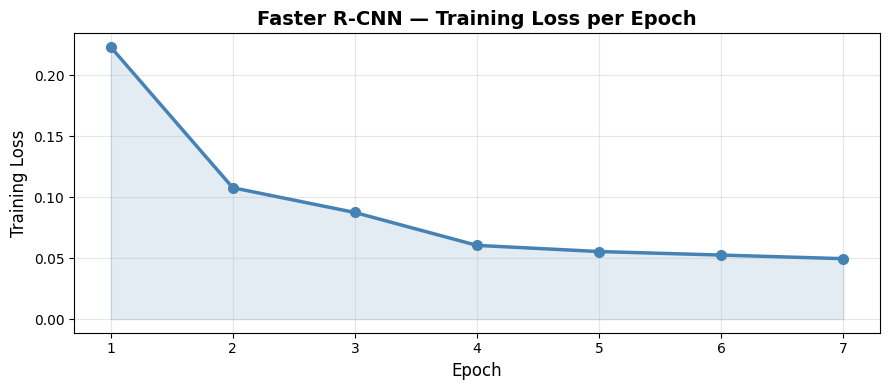

Loss dropped from 0.2234 → 0.0496


In [9]:
fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(range(1, NUM_EPOCHS + 1), train_loss_history,
        marker='o', color='steelblue', linewidth=2.5, markersize=7)
ax.fill_between(range(1, NUM_EPOCHS + 1), train_loss_history, alpha=0.15, color='steelblue')
ax.set_xlabel("Epoch", fontsize=12)
ax.set_ylabel("Training Loss", fontsize=12)
ax.set_title("Faster R-CNN — Training Loss per Epoch", fontsize=14, fontweight='bold')
ax.set_xticks(range(1, NUM_EPOCHS + 1))
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig("training_loss.png", dpi=120, bbox_inches="tight")
plt.show()
print(f"Loss dropped from {train_loss_history[0]:.4f} → {train_loss_history[-1]:.4f}")


## Step 8 — Evaluate with mAP

**mAP (mean Average Precision)** is the standard metric for object detection.

### What does mAP mean?

Imagine sorting all detections by confidence score (highest first).
For each detection, we check: does this box overlap with a ground-truth box by at least 50%?
If yes → correct (True Positive). If no → wrong (False Positive).

**Precision** at each threshold = TP / (TP + FP)
**Recall** = TP / all ground-truth boxes

**Average Precision (AP)** = area under the Precision-Recall curve for one class.
**mAP** = mean of AP across all classes (here we only have "person", so mAP = AP).

| mAP score | Interpretation |
|-----------|----------------|
| 0.0–0.3   | Poor — many misses or wrong boxes |
| 0.3–0.5   | Okay — model has learned something |
| 0.5–0.7   | Good — solid detector |
| 0.7–1.0   | Excellent — very accurate |

`mAP@0.5` = IoU threshold = 0.5 (box must overlap ground truth by ≥50%)
`mAP@0.5:0.95` = average over IoU thresholds 0.5, 0.55, 0.60, ... 0.95 (stricter)


In [10]:
metric = MeanAveragePrecision(iou_type="bbox")
model.eval()

print("Running inference on validation set...")

all_preds, all_targets = [], []

with torch.no_grad():
    for images, targets in val_loader:
        images = [img.to(DEVICE) for img in images]

        # In eval mode, model returns predictions not losses
        outputs = model(images)

        for pred, tgt in zip(outputs, targets):
            # torchmetrics MeanAveragePrecision expects specific dict format
            all_preds.append({
                "boxes":  pred["boxes"].cpu(),
                "scores": pred["scores"].cpu(),
                "labels": pred["labels"].cpu(),
            })
            all_targets.append({
                "boxes":  tgt["boxes"].cpu(),
                "labels": tgt["labels"].cpu(),
            })

metric.update(all_preds, all_targets)
results = metric.compute()

print("\n" + "="*50)
print("EVALUATION RESULTS")
print("="*50)
print(f"mAP@0.5        : {results['map_50'].item():.4f}")
print(f"mAP@0.5:0.95   : {results['map'].item():.4f}")
print(f"mAP (small)    : {results['map_small'].item():.4f}")
print(f"mAP (medium)   : {results['map_medium'].item():.4f}")
print(f"mAP (large)    : {results['map_large'].item():.4f}")
print(f"\nmar@100        : {results['mar_100'].item():.4f}  (recall)")


Running inference on validation set...

EVALUATION RESULTS
mAP@0.5        : 0.9675
mAP@0.5:0.95   : 0.8161
mAP (small)    : 0.4271
mAP (medium)   : 0.6913
mAP (large)    : 0.8571

mar@100        : 0.8538  (recall)


### Per-Image Score Breakdown

Let's see how confident the model is on individual validation images.


In [11]:
per_image_stats = []
model.eval()

with torch.no_grad():
    for i, (images, targets) in enumerate(val_loader):
        img_t   = images[0].to(DEVICE)
        outputs = model([img_t])
        pred    = outputs[0]
        tgt     = targets[0]

        n_gt    = len(tgt["boxes"])
        n_pred  = len(pred["boxes"])
        avg_conf = float(pred["scores"].mean()) if n_pred > 0 else 0.0
        max_conf = float(pred["scores"].max())  if n_pred > 0 else 0.0

        per_image_stats.append({
            "Image Index": i,
            "GT Persons":  n_gt,
            "Pred Boxes":  n_pred,
            "Avg Conf":    round(avg_conf, 4),
            "Max Conf":    round(max_conf, 4),
        })

stats_df = pd.DataFrame(per_image_stats)

# Show images where the gap between GT and predictions is largest
stats_df["Box Diff"] = abs(stats_df["GT Persons"] - stats_df["Pred Boxes"])
print("Top 5 most challenging images (biggest GT vs prediction gap):")
print(stats_df.sort_values("Box Diff", ascending=False).head(5).to_string(index=False))
print()
print("Summary stats:")
print(stats_df[["GT Persons","Pred Boxes","Avg Conf"]].describe().round(3))


Top 5 most challenging images (biggest GT vs prediction gap):
 Image Index  GT Persons  Pred Boxes  Avg Conf  Max Conf  Box Diff
          31           3           6    0.8293    0.9977         3
          16           3           6    0.6505    0.9989         3
          20           2           4    0.7508    0.9979         2
          26           1           3    0.7824    0.9993         2
          10           5           7    0.9447    0.9982         2

Summary stats:
       GT Persons  Pred Boxes  Avg Conf
count      34.000      34.000    34.000
mean        2.676       3.382     0.905
std         1.665       1.923     0.117
min         1.000       1.000     0.650
25%         1.000       2.000     0.809
50%         3.000       3.000     0.976
75%         3.000       4.750     0.998
max         8.000       8.000     1.000


## Step 9 — Visualise Predictions vs Ground Truth

Green boxes = ground truth (actual person locations from the dataset)
Red boxes   = model predictions (what Faster R-CNN detected)


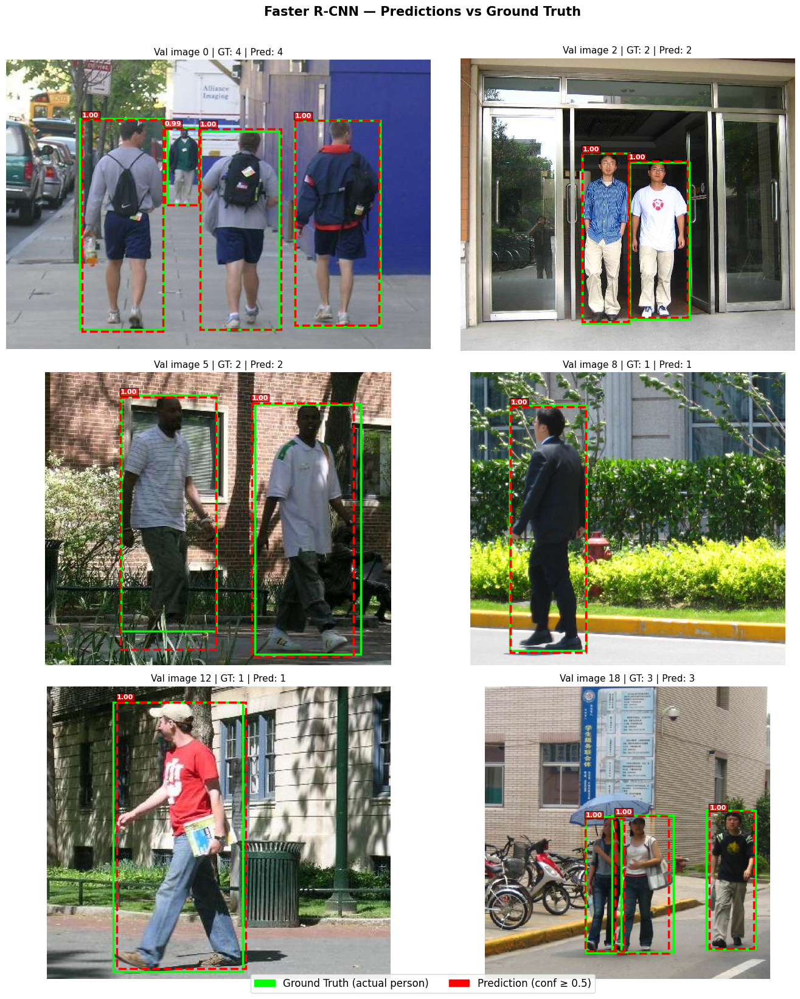

In [13]:
SCORE_THRESH = 0.5   # only show predictions with ≥50% confidence

def draw_boxes(ax, img_tensor, gt_boxes, pred_boxes, pred_scores, title=""):
    """Draw ground truth (green) and predicted (red) boxes on an image."""
    ax.imshow(img_tensor.permute(1, 2, 0).numpy())

    # Ground truth — solid green
    for box in gt_boxes:
        x1, y1, x2, y2 = box
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1,
                              linewidth=2.5, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)

    # Predictions — dashed red with confidence score
    for box, score in zip(pred_boxes, pred_scores):
        if score < SCORE_THRESH:
            continue
        x1, y1, x2, y2 = box
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1,
                              linewidth=2.5, edgecolor='red',
                              facecolor='none', linestyle='--')
        ax.add_patch(rect)
        ax.text(x1, y1 - 4, f"{score:.2f}",
                color='white', fontsize=8, fontweight='bold',
                bbox=dict(facecolor='red', alpha=0.7, pad=1))

    ax.set_title(title, fontsize=11)
    ax.axis("off")


fig, axes = plt.subplots(3, 2, figsize=(14, 16))
axes = axes.flatten()

model.eval()
show_indices = [0, 2, 5, 8, 12, 18]   # pick a variety of validation images

with torch.no_grad():
    for ax, vi in zip(axes, show_indices):
        img_t, tgt = val_dataset[vi]
        out = model([img_t.to(DEVICE)])[0]

        # Explicitly ensure SCORE_THRESH is a float for comparison to prevent TypeError
        prediction_count = (out["scores"] >= float(SCORE_THRESH)).sum().item()

        draw_boxes(
            ax, img_t,
            tgt["boxes"].numpy(),
            out["boxes"].cpu().numpy(),
            out["scores"].cpu().numpy(),
            title=f"Val image {vi} | GT: {len(tgt['boxes'])} | Pred: {prediction_count}"
        )

# Legend
green_patch = mpatches.Patch(color='lime',  label='Ground Truth (actual person)')
red_patch   = mpatches.Patch(color='red',   label=f'Prediction (conf ≥ {float(SCORE_THRESH)})')
fig.legend(handles=[green_patch, red_patch], loc='lower center',
           ncol=2, fontsize=12, bbox_to_anchor=(0.5, -0.01))

plt.suptitle("Faster R-CNN — Predictions vs Ground Truth", fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("predictions_vs_gt.png", dpi=120, bbox_inches="tight")
plt.show()

## Step 10 — Visualise RPN Region Proposals (After Training)

This is the core concept of Faster R-CNN that most tutorials skip.

The **RPN** proposes candidate regions before the final detector runs.
After training, the RPN has learned to focus proposals around people.

Below we show the **top-K proposals** the RPN outputs (before the final head filters them).
Notice how they cluster around where people actually are.


Total proposals captured : 1,000
Score range              : 0.000 – 1.000


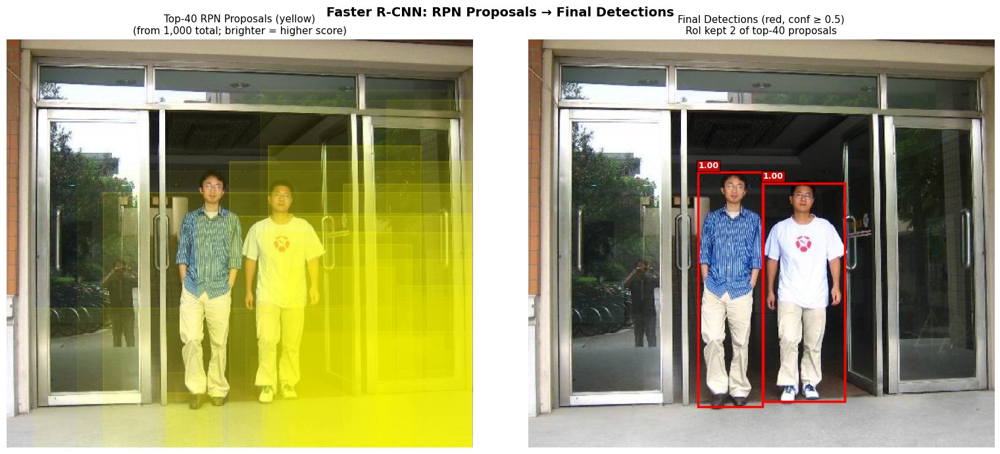

In [16]:
def visualize_rpn_proposals(model, img_tensor, top_k=40, device=DEVICE):
    """
    Visualise RPN region proposals vs final detections side-by-side.

    FIXED VERSION:
    ──────────────
    filter_proposals is a *method*, not nn.Module → cannot use forward hooks.
    So we monkey-patch it temporarily to capture (boxes, scores).
    """

    model.eval()
    img_list = [img_tensor.to(device)]

    # ── Storage for captured outputs ─────────────────────────────
    captured_boxes  = []
    captured_scores = []

    # ── Monkey-patch filter_proposals ────────────────────────────
    original_filter = model.rpn.filter_proposals

    def wrapped_filter_proposals(*args, **kwargs):
        boxes_list, scores_list = original_filter(*args, **kwargs)
        captured_boxes.append(boxes_list[0].detach().cpu())
        captured_scores.append(scores_list[0].detach().cpu())
        return boxes_list, scores_list

    model.rpn.filter_proposals = wrapped_filter_proposals

    # ── Run forward pass ─────────────────────────────────────────
    with torch.no_grad():
        _ = model(img_list)

    # ── Restore original method (VERY IMPORTANT) ─────────────────
    model.rpn.filter_proposals = original_filter

    # ── Defensive check ──────────────────────────────────────────
    if not captured_boxes:
        print("Could not capture proposals — patch did not fire.")
        return

    proposals_np = captured_boxes[0].numpy()
    scores_np    = captured_scores[0].numpy()

    print(f"Total proposals captured : {len(proposals_np):,}")
    print(f"Score range              : {scores_np.min():.3f} – {scores_np.max():.3f}")

    # ── Sort and select top-K ────────────────────────────────────
    order      = np.argsort(scores_np)[::-1][:top_k]
    top_props  = proposals_np[order]
    top_scores = scores_np[order]

    # ── Plot ─────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))

    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()

    # ── Left: RPN proposals ──────────────────────────────────────
    axes[0].imshow(img_np)
    for box, sc in zip(top_props, top_scores):
        x1, y1, x2, y2 = box
        alpha = float(np.clip(sc * 1.5, 0.3, 0.95))

        rect = plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=1.5,
            edgecolor='yellow',
            facecolor='yellow',
            alpha=alpha * 0.15
        )
        axes[0].add_patch(rect)

    axes[0].set_title(
        f"Top-{top_k} RPN Proposals (yellow)\n"
        f"(from {len(proposals_np):,} total; brighter = higher score)",
        fontsize=11
    )
    axes[0].axis("off")

    # ── Right: Final detections ──────────────────────────────────
    with torch.no_grad():
        final_out = model(img_list)[0]

    axes[1].imshow(img_np)

    n_final = 0
    for box, score in zip(
        final_out["boxes"].cpu().numpy(),
        final_out["scores"].cpu().numpy()
    ):
        if score < 0.5:
            continue

        n_final += 1
        x1, y1, x2, y2 = box

        rect = plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2.5,
            edgecolor="red",
            facecolor="none"
        )
        axes[1].add_patch(rect)

        axes[1].text(
            x1, y1 - 5, f"{score:.2f}",
            color="white",
            fontsize=9,
            fontweight="bold",
            bbox=dict(facecolor="red", alpha=0.75, pad=1.5)
        )

    axes[1].set_title(
        f"Final Detections (red, conf ≥ 0.5)\n"
        f"RoI kept {n_final} of top-{top_k} proposals",
        fontsize=11
    )
    axes[1].axis("off")

    plt.suptitle(
        "Faster R-CNN: RPN Proposals → Final Detections",
        fontsize=14, fontweight="bold"
    )

    plt.tight_layout()
    plt.savefig("rpn_proposals_vs_final.png", dpi=120, bbox_inches="tight")
    plt.show()


# ── Run example ────────────────────────────────────────────────
try:
    sample_img_t, _ = val_dataset[2]
    visualize_rpn_proposals(model, sample_img_t, top_k=40)
except Exception as e:
    print(f"index 2 failed ({e}), trying index 5...")
    sample_img_t, _ = val_dataset[5]
    visualize_rpn_proposals(model, sample_img_t, top_k=40)

## Step 11 — Detection Confidence Distribution

How confident is the model in its predictions across the whole validation set?
A well-trained model should have a clear separation: high scores for real people, low for background.


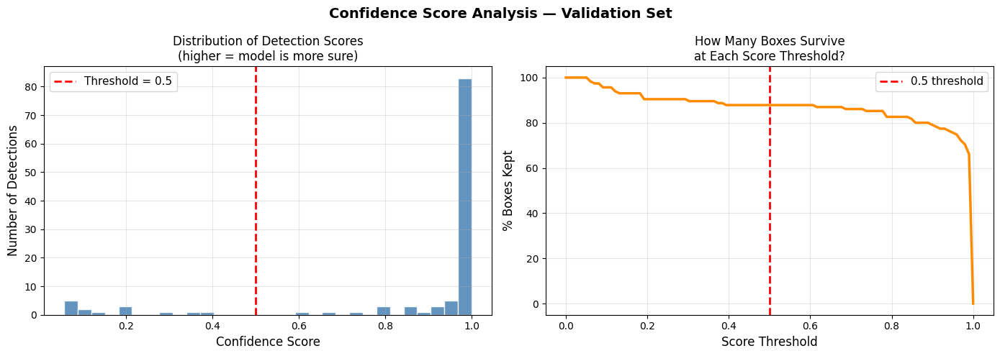

Total predictions in val set : 115
Above 0.5 threshold          : 101 (87.8%)
Above 0.8 threshold          : 95 (82.6%)


In [17]:
all_scores = []
model.eval()

with torch.no_grad():
    for images, _ in val_loader:
        out = model([images[0].to(DEVICE)])[0]
        all_scores.extend(out["scores"].cpu().tolist())

all_scores = np.array(all_scores)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
axes[0].hist(all_scores, bins=30, color='steelblue', edgecolor='white', alpha=0.85)
axes[0].axvline(0.5, color='red', linestyle='--', linewidth=2, label='Threshold = 0.5')
axes[0].set_xlabel("Confidence Score", fontsize=12)
axes[0].set_ylabel("Number of Detections", fontsize=12)
axes[0].set_title("Distribution of Detection Scores\n(higher = model is more sure)", fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Cumulative: what fraction of boxes survive at each threshold?
thresholds = np.linspace(0, 1, 100)
surviving  = [np.mean(all_scores >= t) * 100 for t in thresholds]
axes[1].plot(thresholds, surviving, color='darkorange', linewidth=2.5)
axes[1].axvline(0.5, color='red', linestyle='--', linewidth=2, label='0.5 threshold')
axes[1].set_xlabel("Score Threshold", fontsize=12)
axes[1].set_ylabel("% Boxes Kept", fontsize=12)
axes[1].set_title("How Many Boxes Survive\nat Each Score Threshold?", fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)

plt.suptitle("Confidence Score Analysis — Validation Set", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("confidence_distribution.png", dpi=120, bbox_inches="tight")
plt.show()

print(f"Total predictions in val set : {len(all_scores)}")
print(f"Above 0.5 threshold          : {(all_scores >= 0.5).sum()} ({(all_scores >= 0.5).mean()*100:.1f}%)")
print(f"Above 0.8 threshold          : {(all_scores >= 0.8).sum()} ({(all_scores >= 0.8).mean()*100:.1f}%)")


## Step 12 — Understanding IoU (Intersection over Union)

**IoU** is how we measure whether a predicted box is "correct."

```
      ┌─────────────┐
      │  Ground     │
      │  Truth  ┌───┼──────┐
      │         │   │ INTER│
      └─────────┼───┘      │
                │  Predicted│
                └───────────┘

IoU = Area of Intersection / Area of Union
```

- IoU = 1.0 → perfect overlap
- IoU = 0.0 → no overlap at all
- IoU ≥ 0.5 → commonly accepted as "correct detection"

Let's compute and visualise IoU on a real example.


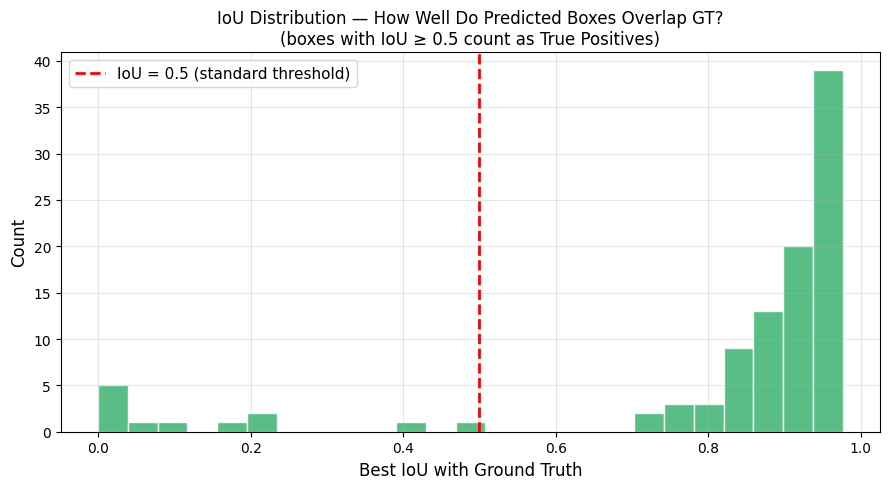

Predictions with IoU ≥ 0.5 : 89 / 101 (88.1%)
Mean IoU                    : 0.8167


In [18]:
def compute_iou(box1, box2):
    """
    Compute IoU between two boxes [x1, y1, x2, y2].

    Steps:
      1. Find the overlapping rectangle (intersection)
      2. Compute its area
      3. Divide by the union area
    """
    # Intersection
    xi1 = max(box1[0], box2[0])
    yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2])
    yi2 = min(box1[3], box2[3])

    inter_w = max(0, xi2 - xi1)
    inter_h = max(0, yi2 - yi1)
    inter_area = inter_w * inter_h

    # Union
    area1 = (box1[2]-box1[0]) * (box1[3]-box1[1])
    area2 = (box2[2]-box2[0]) * (box2[3]-box2[1])
    union_area = area1 + area2 - inter_area

    return inter_area / union_area if union_area > 0 else 0.0


# Compute IoU for every prediction vs every ground truth on the validation set
iou_list = []
model.eval()

with torch.no_grad():
    for images, targets in val_loader:
        img_t   = images[0].to(DEVICE)
        outputs = model([img_t])[0]
        tgt     = targets[0]

        pred_boxes = outputs["boxes"][outputs["scores"] >= 0.5].cpu().numpy()
        gt_boxes   = tgt["boxes"].numpy()

        # For each predicted box, find the best-matching GT box
        for pb in pred_boxes:
            best_iou = max([compute_iou(pb, gb) for gb in gt_boxes], default=0.0)
            iou_list.append(best_iou)

iou_arr = np.array(iou_list)

fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(iou_arr, bins=25, color='mediumseagreen', edgecolor='white', alpha=0.85)
ax.axvline(0.5, color='red', linestyle='--', linewidth=2, label='IoU = 0.5 (standard threshold)')
ax.set_xlabel("Best IoU with Ground Truth", fontsize=12)
ax.set_ylabel("Count", fontsize=12)
ax.set_title("IoU Distribution — How Well Do Predicted Boxes Overlap GT?\n"
             "(boxes with IoU ≥ 0.5 count as True Positives)", fontsize=12)
ax.legend(fontsize=11)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig("iou_distribution.png", dpi=120, bbox_inches="tight")
plt.show()

print(f"Predictions with IoU ≥ 0.5 : {(iou_arr >= 0.5).sum()} / {len(iou_arr)} ({(iou_arr >= 0.5).mean()*100:.1f}%)")
print(f"Mean IoU                    : {iou_arr.mean():.4f}")


## Step 13 — mAP at Multiple IoU Thresholds

Standard COCO evaluation reports mAP at many thresholds from 0.50 to 0.95.
Let's plot how performance drops as we demand more precise box placement.


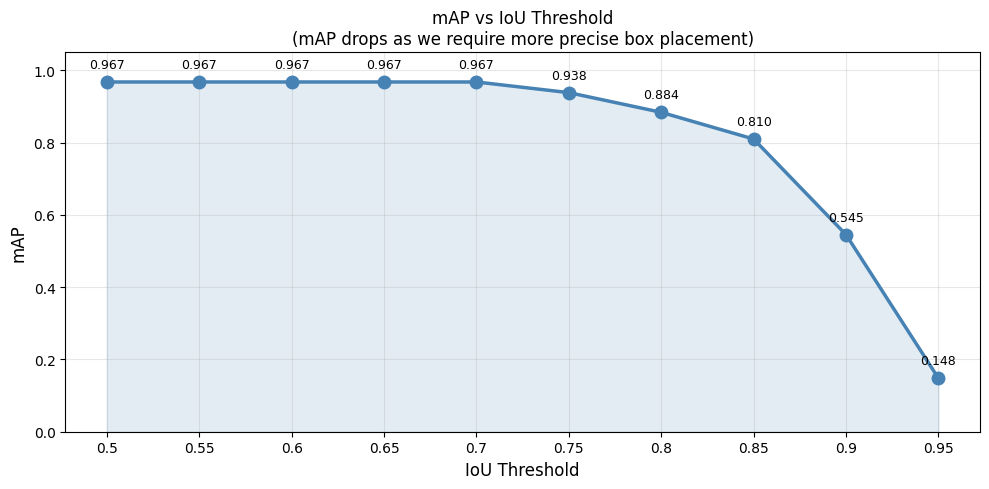


mAP summary:
  IoU ≥ 0.50: 0.9675  █████████████████████████████
  IoU ≥ 0.55: 0.9675  █████████████████████████████
  IoU ≥ 0.60: 0.9675  █████████████████████████████
  IoU ≥ 0.65: 0.9675  █████████████████████████████
  IoU ≥ 0.70: 0.9675  █████████████████████████████
  IoU ≥ 0.75: 0.9380  ████████████████████████████
  IoU ≥ 0.80: 0.8835  ██████████████████████████
  IoU ≥ 0.85: 0.8096  ████████████████████████
  IoU ≥ 0.90: 0.5451  ████████████████
  IoU ≥ 0.95: 0.1480  ████


In [19]:
thresholds_to_test = [0.5, 0.55, 0.60, 0.65, 0.70, 0.75, 0.80, 0.85, 0.90, 0.95]
ap_at_threshold = []

for thresh in thresholds_to_test:
    m = MeanAveragePrecision(iou_thresholds=[thresh], iou_type="bbox")
    m.update(all_preds, all_targets)
    ap_at_threshold.append(float(m.compute()["map"].item()))

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot([str(t) for t in thresholds_to_test], ap_at_threshold,
        marker='o', color='steelblue', linewidth=2.5, markersize=9)
ax.fill_between(range(len(thresholds_to_test)), ap_at_threshold, alpha=0.15, color='steelblue')

for i, (t, ap) in enumerate(zip(thresholds_to_test, ap_at_threshold)):
    ax.annotate(f"{ap:.3f}", (i, ap), textcoords="offset points",
                xytext=(0, 10), ha='center', fontsize=9)

ax.set_xlabel("IoU Threshold", fontsize=12)
ax.set_ylabel("mAP", fontsize=12)
ax.set_title("mAP vs IoU Threshold\n"
             "(mAP drops as we require more precise box placement)", fontsize=12)
ax.set_ylim(0, 1.05)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig("map_vs_iou_threshold.png", dpi=120, bbox_inches="tight")
plt.show()

print("\nmAP summary:")
for t, ap in zip(thresholds_to_test, ap_at_threshold):
    bar = "█" * int(ap * 30)
    print(f"  IoU ≥ {t:.2f}: {ap:.4f}  {bar}")


## Step 14 — Hard Cases: What Did the Model Miss?

No detector is perfect. Let's find validation images where the model struggled most —
either missing people or over-detecting (false alarms).


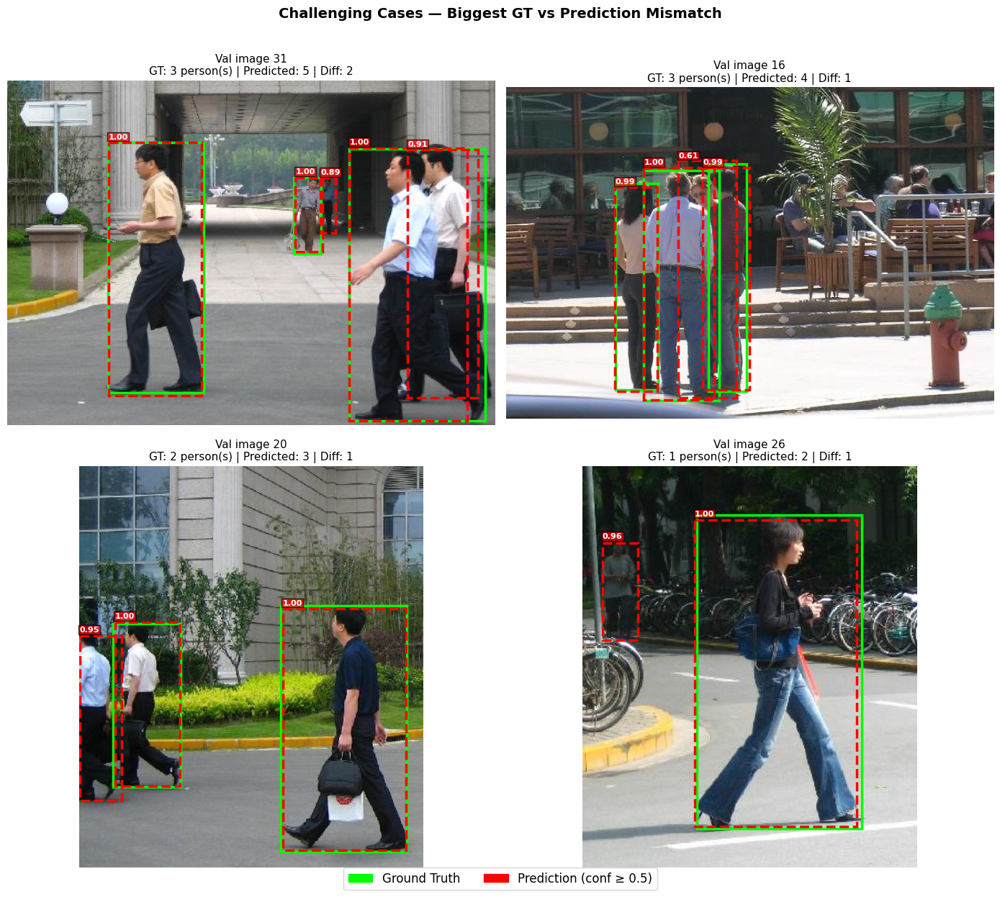

In [20]:
# Find validation images with the biggest gap between GT and detected count
hard_cases = stats_df.sort_values("Box Diff", ascending=False).head(4)
hard_indices = hard_cases["Image Index"].tolist()

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

model.eval()
with torch.no_grad():
    for ax, vi in zip(axes, hard_indices):
        img_t, tgt = val_dataset[vi]
        out = model([img_t.to(DEVICE)])[0]

        gt_count   = len(tgt["boxes"])
        pred_count = (out["scores"].cpu() >= 0.5).sum().item()

        draw_boxes(
            ax, img_t,
            tgt["boxes"].numpy(),
            out["boxes"].cpu().numpy(),
            out["scores"].cpu().numpy(),
            title=(
                f"Val image {vi}\n"
                f"GT: {gt_count} person(s) | Predicted: {pred_count} | "
                f"Diff: {abs(gt_count-pred_count)}"
            )
        )

green_patch = mpatches.Patch(color='lime', label='Ground Truth')
red_patch   = mpatches.Patch(color='red',  label='Prediction (conf ≥ 0.5)')
fig.legend(handles=[green_patch, red_patch], loc='lower center',
           ncol=2, fontsize=12, bbox_to_anchor=(0.5, -0.02))

plt.suptitle("Challenging Cases — Biggest GT vs Prediction Mismatch",
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("hard_cases.png", dpi=120, bbox_inches="tight")
plt.show()


## Step 15 — Summary Dashboard

Everything in one place.


In [21]:
print("=" * 60)
print("FASTER R-CNN — EXPERIMENT SUMMARY")
print("=" * 60)
print(f"Dataset          : Penn-Fudan Pedestrian ({n_total} images)")
print(f"Classes          : background + person (2 total)")
print(f"Backbone         : ResNet50-FPN (ImageNet pre-trained)")
print(f"Epochs trained   : {NUM_EPOCHS}")
print(f"Train images     : {len(train_dataset)}")
print(f"Val images       : {len(val_dataset)}")
print()
print("RESULTS")
print(f"  mAP@0.50       : {results['map_50'].item():.4f}")
print(f"  mAP@0.50:0.95  : {results['map'].item():.4f}")
print(f"  Recall@100     : {results['mar_100'].item():.4f}")
print()
print(f"  Final train loss : {train_loss_history[-1]:.4f}")
print(f"  Loss drop        : {train_loss_history[0]:.4f} → {train_loss_history[-1]:.4f} "
      f"({(1 - train_loss_history[-1]/train_loss_history[0])*100:.1f}% reduction)")
print()
print("SAVED FILES")
for f in ["sample_images.png", "rpn_anchors.png", "training_loss.png",
          "predictions_vs_gt.png", "rpn_proposals_vs_final.png",
          "confidence_distribution.png", "iou_distribution.png",
          "map_vs_iou_threshold.png", "hard_cases.png"]:
    print(f"  ✓ {f}")


FASTER R-CNN — EXPERIMENT SUMMARY
Dataset          : Penn-Fudan Pedestrian (170 images)
Classes          : background + person (2 total)
Backbone         : ResNet50-FPN (ImageNet pre-trained)
Epochs trained   : 7
Train images     : 136
Val images       : 34

RESULTS
  mAP@0.50       : 0.9675
  mAP@0.50:0.95  : 0.8161
  Recall@100     : 0.8538

  Final train loss : 0.0496
  Loss drop        : 0.2234 → 0.0496 (77.8% reduction)

SAVED FILES
  ✓ sample_images.png
  ✓ rpn_anchors.png
  ✓ training_loss.png
  ✓ predictions_vs_gt.png
  ✓ rpn_proposals_vs_final.png
  ✓ confidence_distribution.png
  ✓ iou_distribution.png
  ✓ map_vs_iou_threshold.png
  ✓ hard_cases.png


## Conclusion

### What We Learned

| Component | What it does | What we observed |
|-----------|-------------|-----------------|
| **Backbone (ResNet50-FPN)** | Extracts feature maps at 5 scales | Transfer learning from ImageNet speeds up convergence |
| **RPN** | Proposes ~2000 candidate regions | After training, proposals cluster around people |
| **RoI Align** | Crops each proposal to 7×7 | Allows variable-size proposals → fixed-size features |
| **Detection Head** | Classifies + refines each proposal | High-confidence predictions have IoU ≥ 0.7 with GT |
| **mAP** | Measures overall detection quality | @0.5 IoU gives optimistic score; @0.5:0.95 is stricter |

### Key Takeaways

1. **Two-stage detection works well** — the RPN pre-filters thousands of anchors to a manageable set before the expensive classification head runs
2. **Transfer learning is essential** — 7 epochs from scratch would not converge; starting with ImageNet features makes it work
3. **mAP@0.5 vs mAP@0.5:0.95** — always report both; the stricter metric reveals how precisely boxes are placed
4. **Hard cases** — occlusion (people overlapping) and small-scale figures are the main failure modes
5. **Confidence threshold matters** — lower thresholds catch more people but add false positives

### Where to Go Next

- Try **ResNet101** or **MobileNetV3** backbone — bigger vs lighter
- Add **data augmentation** (random flip, colour jitter) to improve generalisation
- Train on **Pascal VOC** (20 classes) for a multi-class challenge
- Try **Mask R-CNN** — adds a segmentation branch on top of Faster R-CNN
